<a id="outlines"></a>

------------------------------------------
------------------------------------------
------------------------------------------
<h2 align="center" style='color:#0077EE'>Time Series Forecasting using Auto ARIMA & Deep Learning Algorithms</h2><br> 

------------------------------------------
------------------------------------------
------------------------------------------
<h1><span>&#8226;</span> Outline:</h1>
<ul>
    <li><a href="#gather_data">Gathering the data</a>
    <li><a href="#EDA">Look at the data</a>  
    <li><a href="#stationarity">Data stationarity analysis</a>
        <ul>
            <li><a href="#test">Test for Stationarity</a>
            <li><a href="#data_trans">Apply some data transformation for Stationarity</a>   
        </ul>
    <li><a href="#decomposition ">TS Decomposition</a>
    <li><a href="#corr">See the Correlation between Our Time Series.</a>
    <li><a href="#acf_pacf">Plot the ACF & PACF For the data.</a>
    <li><a href="#forecasting">Forecasting</a>
        <ul>
            <li><a href="#auto_arima">Auto ARIMA model</a>
            <li><a href="#DL">Deep Learning Algorithms</a>
                <ul>
                    <li><a href="#mlp">MLP approaches</a>
                        <ul>
                            <li><a href="#uni">Univariate Forecasting</a>
                            <li><a href="#multi">Multivariate Forecasting</a>
                                <ul>
                                    <li><a href="#multi_in">Multiple Input</a>
                                        <ul>
                                        <li><a href="#single_dense">Single Dense</a>
                                        <li><a href="#multi_headed">Multi-headed</a>
                                        </ul>
                                    <li><a href="#multiple_parallel">Multiple Parallel</a>
                                        <ul>
                                        <li><a href="#vector_output">Vector-Output</a>
                                        <li><a href="#multi_output">Multi-Output</a>
                                        </ul>
                                </ul>
                            <li><a href="#multi_step">Multi-Step Forcasting</a>
                                <ul>
                                    <li><a href="#multiple_in_multi_step">Multiple Input</a>
                                    <li><a href="#multiple_parallel_multi_step">Multiple Parallel</a>
                                </ul>
                        </ul>
                </ul>

<a id="gather_data"></a>
<h1>Gathering the data</h1><br>
The used data is from  <a href='https://pypi.org/project/yfinance/'><b>yfinance<a/>

In [1]:
from MLP import *

# You can go offline on demand by using
cf.go_offline() 
# initiate notebook for offline plot
init_notebook_mode(connected=False)
pio.templates.default = 'plotly_white'
plt.rcParams['figure.dpi'] = 100
warnings.filterwarnings("ignore")

In [2]:
# It's a Pythonic way to download historical market data from Yahoo! finance.
raw_data = yfinance.download(tickers='^GSPC ^FTSE ^N225 ^GDAXI', start='2010-01-01', ends='2020-01-01',
                             interval='1d', group_by='tickers', auto_adjust=True, treads=True)

df_comp = raw_data.copy()

df_comp['sequence'] = df_comp['^FTSE'].Close[:]
df_comp['gdaxi'] = df_comp['^GDAXI'].Close[:]
df_comp['nikkei'] = df_comp['^N225'].Close[:]
df_comp['gspc'] = df_comp['^GSPC'].Close[:]

df_comp = df_comp.iloc[4:]
del df_comp['^N225']
del df_comp['^GSPC']
del df_comp['^GDAXI']
del df_comp['^FTSE']


#Convert TimeSeries to specified frequency.
#Using “b” tells Python to expect missing values when the date falls on a Saturday or a Sunday.(only business days)
df_comp=df_comp.asfreq('b') #b=business days, d=days, m=month ....etc

#'ffill' stands for "forward fill" and it takes the last value preceding the null value and fills it.
df_comp = df_comp.fillna(method='ffill')

#Convert the Date to Datetime and set in as TS index
df_comp = df_comp.reset_index()
df_comp['Date'] = pd.to_datetime(df_comp['Date'], dayfirst=True)
df_comp.set_index('Date', inplace=True)

[*********************100%***********************]  4 of 4 completed


In [3]:
df_comp.head()

,sequence,gdaxi,nikkei,gspc
,,,,
Date,,,,
2010-01-07,5526.700195,6019.359863,10681.660156,1141.689941
2010-01-08,5534.200195,6037.609863,10798.320312,1144.979980
2010-01-11,5538.100098,6040.500000,10798.320312,1146.979980
2010-01-12,5498.700195,5943.000000,10879.139648,1136.219971
2010-01-13,5473.500000,5963.140137,10735.030273,1145.680054


<a href="#outlines">Back to outlines</a><br>

<a id="EDA"></a>
## Look at the data

>Lets deal with sequence as our TS data.(Endogenous)<br>
>We can use the other data as exongeous variables.

In [5]:
# plot_line(df_comp, ['sequence','nikkei','gdaxi','gspc'])

<img src="MLP Images/MLP_1.png">

#### Describe

In [6]:
df_comp.reset_index().describe(datetime_is_numeric=True)

,Date,sequence,gdaxi,nikkei,gspc
,,,,,
count,3117,3117.000000,3117.000000,3117.000000,3117.000000
mean,2015-12-28 14:23:26.737247232,6533.069583,10240.155078,17428.927372,2253.445110
min,2010-01-07 00:00:00,4805.799805,5072.330078,8160.009766,1022.580017
25%,2013-01-02 00:00:00,5935.100098,7614.790039,11057.400391,1461.189941
50%,2015-12-29 00:00:00,6622.600098,10432.360352,17768.300781,2086.239990
75%,2018-12-24 00:00:00,7125.000000,12367.459961,21785.539062,2791.520020
max,2021-12-17 00:00:00,7877.500000,16251.129883,30670.099609,4712.020020
std,NaN,696.376182,2763.431063,5985.929356,880.311702


#### Missing values

In [7]:
df_comp.isna().sum()

sequence      0
gdaxi         0
nikkei        0
gspc          0
dtype: int64

#### Splitting the Data

In [8]:
size = int(len(df_comp)*0.7)
df, df_test = df_comp.iloc[:size], df_comp.iloc[size:]

> ### Splitting the data
><b><li>Shuffling is impossible in TS

<a href="#outlines">Back to outlines</a><br>


<a id="stationarity"></a>
## Look at stationarity
Most time-series models assume that the underlying time-series data is **stationary**.  This assumption gives us some nice statistical properties that allows us to use various models for forecasting.

**Stationarity** is a statistical assumption that a time-series has:
*   **Constant mean**
*   **Constant variance**
*   **Autocovariance does not depend on time**

More simply put, if we are using past data to predict future data, we should assume that the data will follow the same general trends and patterns as in the past.  This general statement holds for most training data and modeling tasks.
Sometimes we need to transform the data in order to make it stationary.<br>We can check stationarity using these techniques:

<a id="test"></a>
**Testing the stationarity:**
- Rolling mean and standard deviation and look if they are changing over time. 
- Apply Dickey-Fuller test or KPSS test, and see if we can reject the null hypothesis (that the time series is stationary)

A major difference between KPSS and ADF tests is the capability of the KPSS test to check for stationarity in the 'presence of a deterministic trend'.<br>
The word ‘deterministic’ implies the slope of the trend in the series does not change permanently. That is, even if the series goes through a shock, it tends to regain its original path.

In [10]:
test_stationarity(df, 'sequence', 'Sequence')

===>Results of Dickey-Fuller Test for sequence:

Test Statistic                   -1.484292
p-value                           0.541267
# Lags Used                       4.000000
Number of Observations Used    2176.000000
Critical Value (1%)              -3.433359
Critical Value (5%)              -2.862869
Critical Value (10%)             -2.567478
dtype: float64
Result: The series is not stationary


<img src="MLP Images/MLP_2.png">

**From The Results:**
- We can see that the p-value is **0.93**. This is larger than all of the critical values at the 1%, 5%, and 10% confidence levels. Therefore, we can say that the time series does appear to be non-stationary with a low likelihood of the result being a statistical fluke.
- The Rolling mean is not constant.
- The Rolling variance is not constant.

So, we need to deal with non-stationarity and trend before applying state-space models or even ML models.
We can deal with non-stationarity in TS by various methods:
- Transformation (e.g Log, Square Root, Differencing,...).
- Smoothing (Weakly average, monthly average, Rolling average,...).
- Polynomial fitting (fitting a regression model).
- Decompositions.

<a href="#outlines">Back to outlines</a><br>


<a id="data_trans"></a>
<h3>Let's apply some transformation methods and check the seasonality for each of them

In [10]:
stat_values = {}

#====>Sequence differencing
print('='*10,'Sequence differencing','='*10)
# Transformation 
df_comp['seq_diff'] = df_comp['sequence'].diff()
# Perform stationarity test
stat_values['sequence differencing'] = test_stationarity(df_comp, 'seq_diff', 'sequence differencing', 1)
# Plot data
plot_line(df_comp, y=['sequence', 'seq_diff'], title='sequence differencing')

#====>5-day moving averages sequence
print('='*10,'5-days MA for Log Sequence','='*10)
# Transformation
df_comp['seq_moving_avg'] = df_comp['sequence'].rolling(window = 5, center = False).mean()
# Perform stationarity test
stat_values['5-days MA for log sequence'] = test_stationarity(df_comp, 'seq_moving_avg', '5-days MA for log sequence', 1)
# Plot data
plot_line(df_comp, y=['sequence', 'seq_moving_avg'], title='5-days MA for sequence')

#====>log sequence
print('='*10,'Log Sequence','='*10)
# Transformation 
df_comp['seq_log'] = df_comp['sequence'].apply(lambda x: np.log(x))
# Perform stationarity test
stat_values['log sequence'] = test_stationarity(df_comp, 'seq_log', 'sequence log', 1)
# Plot data
plot_line(df_comp, y=['sequence', 'seq_log'], title='sequence log')

#====>Box-cox for sequence
print('='*10,'Boxcox for sequence','='*10)
# Transformation
df_comp['seq_boxcox'] = boxcox(x=df_comp['sequence'], lmbda=0.0)
# Perform stationarity test
stat_values['Boxcox for sequence'] = test_stationarity(df_comp, 'seq_boxcox', 'Boxcox for sequence', 1)
# Plot data
plot_line(df_comp, y=['sequence', 'seq_boxcox'], title='Boxcox for sequence')

#====>Difference between seq and moving average seq
print('='*10,'Sequence - MA Sequence','='*10)
# Transformation 
df_comp['seq_moving_avg_diff'] = df_comp['sequence'] - df_comp['seq_moving_avg']
# Perform stationarity test
stat_values['Sequence - MA Sequence'] = test_stationarity(df_comp, 'seq_moving_avg', 'Sequence - MA Sequence', 1)
# Plot data
plot_line(df_comp, y=['sequence', 'seq_moving_avg_diff'], title='Sequence - MA Sequence')

========== Sequence differencing ==========
===>Results of Dickey-Fuller Test for seq_diff:

Test Statistic                -1.862413e+01
p-value                        2.060103e-30
# Lags Used                    8.000000e+00
Number of Observations Used    3.090000e+03
Critical Value (1%)           -3.432468e+00
Critical Value (5%)           -2.862476e+00
Critical Value (10%)          -2.567268e+00
dtype: float64
Result: The series is stationary


========== 5-days MA for Log Sequence ==========
===>Results of Dickey-Fuller Test for seq_moving_avg:

Test Statistic                   -2.259665
p-value                           0.185307
# Lags Used                      28.000000
Number of Observations Used    3067.000000
Critical Value (1%)              -3.432484
Critical Value (5%)              -2.862483
Critical Value (10%)             -2.567272
dtype: float64
Result: The series is not stationary


========== Log Sequence ==========
===>Results of Dickey-Fuller Test for seq_log:

Test Statistic                   -2.640271
p-value                           0.084956
# Lags Used                       9.000000
Number of Observations Used    3090.000000
Critical Value (1%)              -3.432468
Critical Value (5%)              -2.862476
Critical Value (10%)             -2.567268
dtype: float64
Result: The series is not stationary


========== Boxcox for sequence ==========
===>Results of Dickey-Fuller Test for seq_boxcox:

Test Statistic                   -2.640271
p-value                           0.084956
# Lags Used                       9.000000
Number of Observations Used    3090.000000
Critical Value (1%)              -3.432468
Critical Value (5%)              -2.862476
Critical Value (10%)             -2.567268
dtype: float64
Result: The series is not stationary


========== Sequence - MA Sequence ==========
===>Results of Dickey-Fuller Test for seq_moving_avg:

Test Statistic                   -2.259665
p-value                           0.185307
# Lags Used                      28.000000
Number of Observations Used    3067.000000
Critical Value (1%)              -3.432484
Critical Value (5%)              -2.862483
Critical Value (10%)             -2.567272
dtype: float64
Result: The series is not stationary


In [11]:
pd.DataFrame(data=stat_values.values(),index=stat_values.keys()).sort_values(by=0,ascending=True).rename(columns={0:'P-Value'})

,P-Value
sequence differencing,2.060103e-30
log sequence,8.495638e-02
Boxcox for sequence,8.495638e-02
5-days MA for log sequence,1.853068e-01
Sequence - MA Sequence,1.853068e-01


>#### We can apply differencing

In [12]:
df_comp = df_comp[['sequence','gdaxi','nikkei','gspc']].iloc[1:,:]

<a href="#outlines">Back to outlines</a><br>

<a id="decomposition"></a>
<h3>Decomposition</h3><br>
A useful abstraction for selecting forecasting methods is to break a time series down into systematic and unsystematic components.
<ul>
<li><b>Systematic:</b> Components of the time series that have consistency or recurrence and can be described and modeled.
<li><b>Non-Systematic:</b> Components of the time series that cannot be directly modeled.<br>
A given time series is thought to consist of three systematic components including level, trend, seasonality, and one non-systematic component called noise.
</ul>
These components are defined as follows:
<ul>
<li><b>Trend:</b> The increasing or decreasing value in the series.
<li><b>Seasonality:</b> The repeating short-term cycle in the series.
<li><b>Noise:</b> The random variation in the series.
</ul>

In [13]:
decomposition = seasonal_decompose(df['sequence'])
seasonal, trend, resid = decomposition.seasonal, decomposition.trend, decomposition.resid

decomposition = pd.DataFrame(index=seasonal.index)
decomposition['Sequence'] = df['sequence']
decomposition['Seasonal'] = seasonal.values
decomposition['Trend'] = trend.values
decomposition['Residuals'] = resid.values

fig = make_subplots(rows=4, cols=1, subplot_titles=['Sequence','Seasonal','Trend','Residuals'], )
fig.append_trace((go.Scatter(x=decomposition.index, y=decomposition['Sequence'], showlegend=False)),1,1)
fig.append_trace((go.Scatter(x=decomposition.index, y=decomposition['Seasonal'], showlegend=False)),2,1)
fig.append_trace((go.Scatter(x=decomposition.index, y=decomposition['Trend'], showlegend=False)),3,1)
fig.append_trace((go.Scatter(x=decomposition.index, y=decomposition['Residuals'], showlegend=False)),4,1)
fig.show()

> <b>WE have:</b>
> <li>A weakly seasonality in the TS.
> <li>An increasing trend.

<a id="corr"></a>
<h1>Correlation</h1><br>

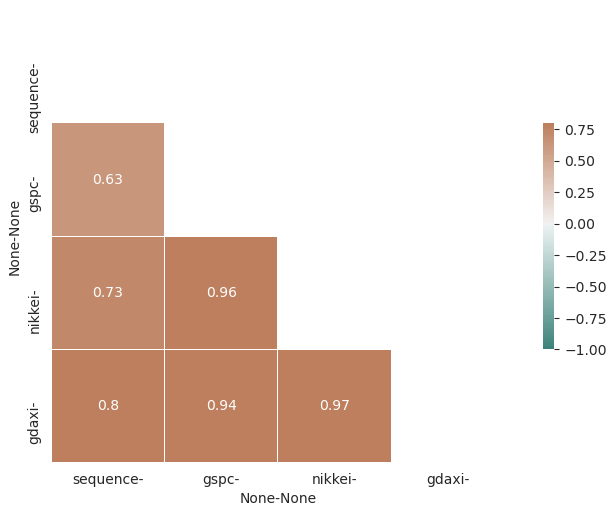

In [17]:
#correlation heatmap
corr = df_comp[['sequence','gspc','nikkei','gdaxi']].corr()

#apply a mask
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)]=True

#sett a palette
cmap = sns.diverging_palette(180, 30, as_cmap=True)

with sns.axes_style('white'):
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.heatmap(corr,  mask=mask, cmap=cmap, annot=True, center=0, vmin=-1, vmax=0.8,
                square=True, cbar_kws={'shrink':.5, 'orientation': 'vertical'}, linewidth=.02);

<a id="acf_pacf"></a>
<h1>Look at ACF and PACF plots</h1><br>

- **ACF:** A mathematical representation of the degree of similarity between a given time series and the lagged version of itself over successive time intervals. In other words, instead of calculating the correlation between two different series, we calculate the correlation of the series with an “x” unit lagged version (x∈N) of itself. It describes how well the present value of the series is related with its past values.
<img src='ACF.png'></img><br><br>
<ul>
<li> r(t) = The time series sorted in ascending order
<li> r(t-k) = The same time series as above but shifted by K units (in our case k=3)
<li> r_bar = Average of the original time series</li>
</ul><br>
- **PACF:** Summarizes the relationshi between an observation and in a TS with an observations at pevious time steps, but with relationships of the intervening obsrvations are removed.<br><br>
So, ACF measures the accumalated affects past lags have on the current value, while PACF measures the direct affect.<br><br>
- The blue area represents Significance

In [18]:
create_corr_plot(df['sequence'], series_name='TS', plot_pacf=False)

In [19]:
create_corr_plot(df['sequence'], series_name='TS', plot_pacf=True)

### <h3>For ACF:</h3>
<ul>
    <li>All spikes are significant.
    <li>All othem are between 0.88 - 1.0.</li>
    <li>It shows that the effects are decaying over time, that means future values of the series are correlated heavily by past values.</li>
</ul>
The more lags we include, the better the model will fit the data set we feed.</b>
<h3>For PACF:</h3><ul>
    <li>Coefficient in different size.
    <li>Ther're coefficients are neg(-).
    <li>Ther're coefficients are not significant.
        </ul>
        

<li><a href="#outlines">Back to outlines</a>

<a id="forecasting"></a>
<h1>Forecasting</h1><br>

<a id="auto_arima"></a>
<h2><u>First:</u> ARIMA Models</h2><br>

In [20]:
from pmdarima.arima import auto_arima

In [21]:
model_auto = auto_arima(df['gspc']['2015':'2018'], m=7, # The period for seasonal differencing(one weak)
                        exogenousdf=df[['sequence','gdaxi','nikkei']]['2017':'2018'], 
                        max_p = 5, max_q = 5, max_P = 5, max_Q = 5) 

In [22]:
#Save the trained model
import pickle

# Serialize with Pickle
with open('auto_arima_pick.pkl', 'wb') as pkl:
    pickle.dump(model_auto, pkl)

# Now read it back and make a prediction
with open('auto_arima_pick.pkl', 'rb') as pkl:
    auto_arima = pickle.load(pkl)

In [23]:
auto_arima

ARIMA(order=(2, 1, 2), scoring_args={}, seasonal_order=(0, 0, 0, 7),
      suppress_warnings=True, with_intercept=False)

In [24]:
arima_res = pd.DataFrame({'Auto ARIMA residuals':auto_arima.resid()})

In [25]:
plot_line(arima_res, 'Auto ARIMA residuals', 'Auto-ARIMA Residuals')

In [26]:
plot_hist(arima_res, 'Auto-ARIMA Residuals')

In [27]:
create_corr_plot(arima_res)

**From the residual analysis:**
- Its autocorrelation function is very week.
- Almost follow a White Noise.

so, i think we this is the best fit to the data, we didn't loss any important patterns in the data.

In [111]:
actual = df['gspc']['2018':'2019'][:50]
pred = auto_arima.predict(len(actual), X=df[['sequence','gdaxi','nikkei']]['2018':'2019'])
auto_pred_df = pd.DataFrame({'Actual':actual,
                            'Predictions':pred})

In [112]:
plot_line(auto_pred_df, ['Actual','Predictions'])

<a id="DL"></a>
<h2><u>Second:</u> Deep Learning Algorithms</h2><br>

<a id="mlp"></a>
<h3><u>1:</u> MLP Approaches</h3><br>

<h4>We will build MLP models for:</h4>
<ul>
    <li>Univariate time series forecasting.
    <li>Multivariate time series forecasting.
        <ul>
            <li>Multiple Input Series.
            <li>Multiple Parallel Series.
                <ul>
                    <li>Vector-Output MLP Model.
                    <li>Multi-output MLP Model.</li>
                </ul>
        </ul>
    <li>Multi-step time series forecasting.
        <ul>
            <li>Vector-Output Model.
        </ul></ul>

<a id="uni"></a>
### 1) Univariate MLP Models
**Univariate time series** are a dataset comprised of a single series of observations with a temporal ordering and a model is required to learn from the series of past observations to predict the next value in the sequence.
<img src='Sliding Window.png' height="1000" width="500"></img>

- Apply window function to the sequence.
- Model will have input features equal to the (window_size-1) and output equals to one.
- It don't take the input as sequenced data, it is just receiving inputs and don't treat them as sequenced data, that may be a problem since the model won't see the data with the sequence patter that it has.
- Input shape [samples, timesteps].

<li><a href="#outlines">Back to outlines</a>

#### Create object

In [28]:
Univariate_MLP = Create_Univariate_MLP(df['gspc']) #Let's Forecast GSPC TS.

Your object is ceated!


#### Training the model

In [29]:
Univariate_MLP.build_dense_layers(w_size=7, epochs=50, lr=0.001, batch=128, scale=True) 

Epoch 1/50
12/12 [==============================] - 1s 16ms/step - loss: 0.7197 - val_loss: 1.5294
Epoch 2/50
12/12 [==============================] - 0s 4ms/step - loss: 0.6166 - val_loss: 1.3435
Epoch 3/50
12/12 [==============================] - 0s 4ms/step - loss: 0.5024 - val_loss: 0.9753
Epoch 4/50
12/12 [==============================] - 0s 5ms/step - loss: 0.3739 - val_loss: 0.6788
Epoch 5/50
12/12 [==============================] - 0s 4ms/step - loss: 0.2516 - val_loss: 0.4293
Epoch 6/50
12/12 [==============================] - 0s 4ms/step - loss: 0.1491 - val_loss: 0.1773
Epoch 7/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0729 - val_loss: 0.0801
Epoch 8/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0301 - val_loss: 0.0251
Epoch 9/50
12/12 [==============================] - 0s 5ms/step - loss: 0.0117 - val_loss: 0.0041
Epoch 10/50
12/12 [==============================] - 0s 5ms/step - loss: 0.0071 - val_loss: 0.0042
Epoch 11/50
12/12 

#### Show training results

In [30]:
Univariate_MLP.show_train_test_results()

In [31]:
Univariate_MLP.plot_results()

#### Forecasting

In [32]:
Univariate_MLP.forecast(df_test['gspc']) #ex. 2019-06-06

Enter the date to start forecasting from (2018-05-02 to 2021-11-23)
Date is not in range of data
Enter the date to start forecasting from (2018-05-02 to 2021-11-23)2019-06-06


<li><a href="#outlines">Back to outlines</a>

<a id="multi"></a>

## Multivariate MLP Models
Multivariate time series data means data where there is more than one observation for each time step. <br><br>
There are two main approaches:
<ul>
<li> Multiple Input Series.
<li> Multiple Parallel Series.

<a id="multiple_in"></a>

### 1) Multiple Input Series
A problem may have two or more parallel input time series and an output time series that is dependent on the input time series.<br>The input time series are parallel because each series has an observation at the same time step.
- The input time series are parallel because each series has an observation at the same time step.
- The first dimension is the number of samples, in this case 2136. 
- The second dimension is the number of time steps per sample, in this case w_size-1, the value specified to the function. 
- Finally, the last dimension specifies the number of parallel time series or the number of variables, in this case 3 for the two parallel series (nikkei, gdaxi, gspc) each series as a column.
- Has two main approaches:
<ul>
    <li>Single model.
    <li>Multi-headed.
</ul>

<a id="single_dense"></a>

## Single Dense Modeling
<img src='single dense.jpg' align='center' height="300" width="300"><h3 align='center'>Window Function for singel dense</h3></img>
<b>Steps:</b>
<ul>
<li>Apply the 2-D window function with <b>size = w_size</b>  to the dataset whose shape is (# of_time_steps, # of_series).
<li>X for each window = window[:,:-1]
<li>y for each window = window[-1:,-1:]<br>
 </ul>
So, input_shape = (X.shape[1] * X.shape[2]) = (# of_time_steps, # of_series), and the output shape = 1.

#### Create our Object 

In [33]:
Multivariate_single_dense_obj = Create_Multivariate_Multple_Input(df[['gdaxi','sequence','nikkei','gspc']], 'single dense')

Your Multivarite object is ceated!


#### Trainig the model

In [34]:
Multivariate_single_dense_obj.build_dense_layers(w_size=7, epochs=100, lr=0.001, batch=128, units=100, scale=True) 
# best results with 7(number of days a week)

Epoch 1/100
12/12 [==============================] - 1s 16ms/step - loss: 0.7448 - val_loss: 1.7679
Epoch 2/100
12/12 [==============================] - 0s 6ms/step - loss: 0.6937 - val_loss: 2.0483
Epoch 3/100
12/12 [==============================] - 0s 6ms/step - loss: 0.6128 - val_loss: 1.7377
Epoch 4/100
12/12 [==============================] - 0s 5ms/step - loss: 0.4584 - val_loss: 1.0116
Epoch 5/100
12/12 [==============================] - 0s 5ms/step - loss: 0.2326 - val_loss: 0.2511
Epoch 6/100
12/12 [==============================] - 0s 5ms/step - loss: 0.0901 - val_loss: 0.1468
Epoch 7/100
12/12 [==============================] - 0s 5ms/step - loss: 0.0629 - val_loss: 0.3183
Epoch 8/100
12/12 [==============================] - 0s 6ms/step - loss: 0.0473 - val_loss: 0.2521
Epoch 9/100
12/12 [==============================] - 0s 6ms/step - loss: 0.0412 - val_loss: 0.2987
Epoch 10/100
12/12 [==============================] - 0s 6ms/step - loss: 0.0377 - val_loss: 0.3361
Epoch 11

#### Show training results

In [35]:
Multivariate_single_dense_obj.show_train_test_results()

In [36]:
Multivariate_single_dense_obj.plot_results()

#### Forecasting

In [37]:
Multivariate_single_dense_obj.forecast(df_test[['gdaxi','nikkei','sequence','gspc']]) #2019-06-06

Enter the date to start forecasting from (2018-05-02 to 2021-11-23)
Date is not in range of data
Enter the date to start forecasting from (2018-05-02 to 2021-11-23)2019-06-06


<a id="multi_headed"></a>

##  Multi-headed Modeling

In [38]:
Multivariate_multi_headed_obj = Create_Multivariate_Multple_Input(df[['gdaxi','sequence','nikkei','gspc']], 'multi dense')

Your Multivarite object is ceated!


#### Training the model

In [39]:
model = Multivariate_multi_headed_obj.build_dense_layers(w_size=14, epochs=60, lr=0.003, batch=16, units=128, scale=True) 
#best results with 7(number of days)

Epoch 1/60
95/95 [==============================] - 1s 5ms/step - loss: 0.4630 - val_loss: 0.7245
Epoch 2/60
95/95 [==============================] - 0s 2ms/step - loss: 0.0722 - val_loss: 0.2974
Epoch 3/60
95/95 [==============================] - 0s 3ms/step - loss: 0.0447 - val_loss: 0.3886
Epoch 4/60
95/95 [==============================] - 0s 2ms/step - loss: 0.0340 - val_loss: 0.3930
Epoch 5/60
95/95 [==============================] - 0s 2ms/step - loss: 0.0289 - val_loss: 0.4104
Epoch 6/60
95/95 [==============================] - 0s 2ms/step - loss: 0.0251 - val_loss: 0.3221
Epoch 7/60
95/95 [==============================] - 0s 2ms/step - loss: 0.0261 - val_loss: 0.3204


#### Show training results

In [40]:
Multivariate_multi_headed_obj.show_train_test_results()

In [129]:
Multivariate_multi_headed_obj.plot_results()

#### Forecasting

In [41]:
Multivariate_multi_headed_obj.forecast(df_test[['gdaxi','sequence','nikkei','gspc']]) #2019-06-06

Enter the date to start forecasting from (2018-05-02 to 2021-11-23)2019-06-06


<li><a href="#outlines">Back to outlines</a><br>


<a id="multiple_parallel"></a>

### 2) Multiple Parallel Series
In this case, there are multiple parallel time series and a value must be predicted for each.<br>
So the size of our data will be:
- The first dimension is the number of samples, in this case 2136. 
- The second dimension is the number of time steps per sample, in this case 9 (Window size-1). 
- Finally, the last dimension specifies the number of parallel time series or the number of variables, in this case 3 for the two parallel series.
- Has two main approaches:
<ul>
    <li>Vector Output.
    <li>Multi-Output.

<a href="#outlines">Back to outlines</a><br>

<a id="vector_output"></a>

## Vector-Output

#### Create our Object 

In [43]:
Multivariate_vector_output_obj = Create_Multivariate_Multple_Parallel(df[['gdaxi','sequence','nikkei','gspc']], 'vector output')

Your Multivarite object is ceated!


#### Training the model

In [44]:
Multivariate_vector_output_obj.build_dense_layers(w_size=7, epochs=100, lr=0.003, batch=16, units=50, scale=True)

Epoch 1/100
95/95 [==============================] - 1s 3ms/step - loss: 0.1481 - val_loss: 0.1435
Epoch 2/100
95/95 [==============================] - 0s 2ms/step - loss: 0.0249 - val_loss: 0.0123
Epoch 3/100
95/95 [==============================] - 0s 2ms/step - loss: 0.0054 - val_loss: 0.0123
Epoch 4/100
95/95 [==============================] - 0s 2ms/step - loss: 0.0045 - val_loss: 0.0114
Epoch 5/100
95/95 [==============================] - 0s 2ms/step - loss: 0.0041 - val_loss: 0.0130
Epoch 6/100
95/95 [==============================] - 0s 2ms/step - loss: 0.0039 - val_loss: 0.0113
Epoch 7/100
95/95 [==============================] - 0s 2ms/step - loss: 0.0036 - val_loss: 0.0121
Epoch 8/100
95/95 [==============================] - 0s 2ms/step - loss: 0.0032 - val_loss: 0.0108
Epoch 9/100
95/95 [==============================] - 0s 2ms/step - loss: 0.0028 - val_loss: 0.0088
Epoch 10/100
95/95 [==============================] - 0s 2ms/step - loss: 0.0025 - val_loss: 0.0078
Epoch 11/

#### Show training results

In [45]:
Multivariate_vector_output_obj.show_train_test_results()

In [46]:
Multivariate_vector_output_obj.plot_results()

#### Forecasting

In [47]:
Multivariate_vector_output_obj.forecast(df_test[['gdaxi','sequence','nikkei','gspc']]) #ex. 2019-06-06

Enter the date to start forecasting from (2018-05-02 to 2021-11-23)2019-06-06


<a id="multi_output"></a>

## Multi-Output

#### Create our Object 

In [49]:
Multivariate_multi_output_obj = Create_Multivariate_Multple_Parallel(df[['gdaxi','sequence','nikkei','gspc']], 'multi output')

Your Multivarite object is ceated!


### Training the model

In [50]:
Multivariate_multi_output_obj.build_dense_layers(w_size=14, epochs=100, lr=0.001, batch=100, units=100, scale=True)

Epoch 1/100
16/16 [==============================] - 1s 17ms/step - loss: 1.4157 - dense_14_loss: 0.1186 - dense_15_loss: 0.0317 - dense_16_loss: 0.5356 - dense_17_loss: 0.7298 - val_loss: 1.1461 - val_dense_14_loss: 0.2771 - val_dense_15_loss: 0.0652 - val_dense_16_loss: 0.6652 - val_dense_17_loss: 0.1387
Epoch 2/100
16/16 [==============================] - 0s 5ms/step - loss: 0.4430 - dense_14_loss: 0.0987 - dense_15_loss: 0.0275 - dense_16_loss: 0.2008 - dense_17_loss: 0.1160 - val_loss: 1.1077 - val_dense_14_loss: 0.2808 - val_dense_15_loss: 0.0527 - val_dense_16_loss: 0.2008 - val_dense_17_loss: 0.5732
Epoch 3/100
16/16 [==============================] - 0s 4ms/step - loss: 0.3747 - dense_14_loss: 0.0873 - dense_15_loss: 0.0240 - dense_16_loss: 0.1729 - dense_17_loss: 0.0905 - val_loss: 0.8599 - val_dense_14_loss: 0.2528 - val_dense_15_loss: 0.0494 - val_dense_16_loss: 0.3701 - val_dense_17_loss: 0.1876
Epoch 4/100
16/16 [==============================] - 0s 4ms/step - loss: 0.308

Epoch 28/100
16/16 [==============================] - 0s 4ms/step - loss: 0.0196 - dense_14_loss: 0.0073 - dense_15_loss: 0.0029 - dense_16_loss: 0.0064 - dense_17_loss: 0.0031 - val_loss: 0.0522 - val_dense_14_loss: 0.0209 - val_dense_15_loss: 0.0088 - val_dense_16_loss: 0.0119 - val_dense_17_loss: 0.0106
Epoch 29/100
16/16 [==============================] - 0s 4ms/step - loss: 0.0186 - dense_14_loss: 0.0066 - dense_15_loss: 0.0027 - dense_16_loss: 0.0063 - dense_17_loss: 0.0029 - val_loss: 0.0481 - val_dense_14_loss: 0.0173 - val_dense_15_loss: 0.0084 - val_dense_16_loss: 0.0134 - val_dense_17_loss: 0.0090
Epoch 30/100
16/16 [==============================] - 0s 4ms/step - loss: 0.0185 - dense_14_loss: 0.0065 - dense_15_loss: 0.0028 - dense_16_loss: 0.0063 - dense_17_loss: 0.0029 - val_loss: 0.0488 - val_dense_14_loss: 0.0185 - val_dense_15_loss: 0.0082 - val_dense_16_loss: 0.0131 - val_dense_17_loss: 0.0090
Epoch 31/100
16/16 [==============================] - 0s 4ms/step - loss: 0.

Epoch 55/100
16/16 [==============================] - 0s 4ms/step - loss: 0.0115 - dense_14_loss: 0.0033 - dense_15_loss: 0.0018 - dense_16_loss: 0.0052 - dense_17_loss: 0.0012 - val_loss: 0.0318 - val_dense_14_loss: 0.0083 - val_dense_15_loss: 0.0061 - val_dense_16_loss: 0.0111 - val_dense_17_loss: 0.0063
Epoch 56/100
16/16 [==============================] - 0s 4ms/step - loss: 0.0113 - dense_14_loss: 0.0033 - dense_15_loss: 0.0017 - dense_16_loss: 0.0051 - dense_17_loss: 0.0012 - val_loss: 0.0344 - val_dense_14_loss: 0.0114 - val_dense_15_loss: 0.0063 - val_dense_16_loss: 0.0095 - val_dense_17_loss: 0.0072
Epoch 57/100
16/16 [==============================] - 0s 4ms/step - loss: 0.0117 - dense_14_loss: 0.0034 - dense_15_loss: 0.0017 - dense_16_loss: 0.0053 - dense_17_loss: 0.0012 - val_loss: 0.0321 - val_dense_14_loss: 0.0077 - val_dense_15_loss: 0.0060 - val_dense_16_loss: 0.0126 - val_dense_17_loss: 0.0058
Epoch 58/100
16/16 [==============================] - 0s 4ms/step - loss: 0.

#### Show training results

In [51]:
Multivariate_multi_output_obj.show_train_test_results()

In [52]:
Multivariate_multi_output_obj.plot_results()

#### Forecasting

In [53]:
Multivariate_multi_output_obj.forecast(df_test[['gdaxi','sequence','nikkei','gspc']]) #ex. 2019-06-06

Enter the date to start forecasting from (2018-05-02 to 2021-11-23)2019-06-06


<a id="multi_step"></a>

## Multi-step Forecasting
In this case, we are not trying to predict a vector output that represents different output variables (as in the previous example) but a vector output that represents multiple time steps of one variable.<br>
We have:
<ul>
    <li> Univariate Multi-Setp.
    <li> Multivariate Multi-Step.

<a id="uni_multi_step"></a>

###  Univariate Multi-step
- We split the data as we did in one-step forecasting, but change the ratio between output an input.
- X = Window[:n_inputs] not Window[:-1]
- Y = Window[n_inputs:] not Window[-1]
- Has one main approache:
<ul>
    <li>Vector Output Model
</ul>

<a href="#outlines">Back to outlines</a><br>


#### Create object

In [54]:
Univariate_Multi_Step_MLP = Create_Univariate_Multi_Step_MLP(df['gspc'])

Your object is ceated!


#### Training the model

In [55]:
Univariate_Multi_Step_MLP.build_dense_layers(n_steps_in=28, n_steps_out=3, epochs=128, lr=0.001, batch=128, 
                                             units=128, scale=True)

Epoch 1/128
12/12 [==============================] - 1s 13ms/step - loss: 0.7259 - val_loss: 1.4837
Epoch 2/128
12/12 [==============================] - 0s 6ms/step - loss: 0.5765 - val_loss: 0.6817
Epoch 3/128
12/12 [==============================] - 0s 5ms/step - loss: 0.3245 - val_loss: 0.4263
Epoch 4/128
12/12 [==============================] - 0s 5ms/step - loss: 0.1001 - val_loss: 0.0325
Epoch 5/128
12/12 [==============================] - 0s 5ms/step - loss: 0.0457 - val_loss: 0.0099
Epoch 6/128
12/12 [==============================] - 0s 5ms/step - loss: 0.0290 - val_loss: 0.0372
Epoch 7/128
12/12 [==============================] - 0s 5ms/step - loss: 0.0205 - val_loss: 0.0431
Epoch 8/128
12/12 [==============================] - 0s 6ms/step - loss: 0.0160 - val_loss: 0.0818
Epoch 9/128
12/12 [==============================] - 0s 5ms/step - loss: 0.0131 - val_loss: 0.0656
Epoch 10/128
12/12 [==============================] - 0s 5ms/step - loss: 0.0115 - val_loss: 0.0750


#### Show training results

In [56]:
Univariate_Multi_Step_MLP.show_train_test_results()

#### Forecasting

In [57]:
Univariate_Multi_Step_MLP.forecast(df_test['gspc']) #'2019-04-26'

Enter the date to start forecasting from (2018-05-02 to 2021-11-23)2019-06-06


<a id="multi_multi_step"></a>

## Multivariate Multi-step 

- Has two main approaches:
<ul>
    <li>Multiple Input Model.
    <li>Multiple Parallel Model.

<a href="#outlines">Back to outlines</a><br>


<a id="multiple_in_multi_step"></a>

### Multiple Input Multi-Step Output

#### Create object

In [58]:
Multple_Input_Multi_Step = Create_Multivariate_Multi_Step(df[['gdaxi','sequence','nikkei','gspc']], 'multiple input')

Your Multivarite object is ceated!


#### Training the model

In [59]:
Multple_Input_Multi_Step.build_dense_layers(28, 5, lr=0.003, batch=128, scale=True, epochs=100, units=128)

Epoch 1/100
12/12 [==============================] - 1s 16ms/step - loss: 0.7333 - val_loss: 2.0385
Epoch 2/100
12/12 [==============================] - 0s 6ms/step - loss: 0.6648 - val_loss: 1.8785
Epoch 3/100
12/12 [==============================] - 0s 5ms/step - loss: 0.5599 - val_loss: 1.6309
Epoch 4/100
12/12 [==============================] - 0s 6ms/step - loss: 0.4179 - val_loss: 1.4830
Epoch 5/100
12/12 [==============================] - 0s 6ms/step - loss: 0.2776 - val_loss: 1.3036
Epoch 6/100
12/12 [==============================] - 0s 6ms/step - loss: 0.1858 - val_loss: 1.1618
Epoch 7/100
12/12 [==============================] - 0s 5ms/step - loss: 0.1303 - val_loss: 1.1367
Epoch 8/100
12/12 [==============================] - 0s 6ms/step - loss: 0.0948 - val_loss: 1.0019
Epoch 9/100
12/12 [==============================] - 0s 6ms/step - loss: 0.0780 - val_loss: 0.9898
Epoch 10/100
12/12 [==============================] - 0s 6ms/step - loss: 0.0638 - val_loss: 0.8369
Epoch 11

#### Show train-test results 

In [60]:
Multple_Input_Multi_Step.show_train_test_results()

#### Forecasting

In [61]:
Multple_Input_Multi_Step.forecast(df_test[['gdaxi','sequence','nikkei','gspc']])

Enter the date to start forecasting from (2018-05-02 to 2021-11-23)2019-06-06


<a id="multiple_parallel_multi_step"></a>

### Multiple Parallel Multi-Step Output 


#### Create object

In [62]:
Multple_Parallel_Multi_Step = Create_Multivariate_Multi_Step(df[['gdaxi','sequence','nikkei','gspc']], 'multiple parallel')

Your Multivarite object is ceated!


#### Training the model

In [63]:
Multple_Parallel_Multi_Step.build_dense_layers(29, 5, lr=0.003, batch=16, scale=True, epochs=5, units=100)

Epoch 1/5
94/94 [==============================] - 1s 3ms/step - loss: 0.1399 - val_loss: 0.0589
Epoch 2/5
94/94 [==============================] - 0s 2ms/step - loss: 0.0194 - val_loss: 0.0253
Epoch 3/5
94/94 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0264
Epoch 4/5
94/94 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0248
Epoch 5/5
94/94 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0242


#### Show train-test results 

In [64]:
Multple_Parallel_Multi_Step.show_train_test_results()

#### Forecasting

In [65]:
Multple_Parallel_Multi_Step.forecast(df_test[['gdaxi','sequence','nikkei','gspc']])

Enter the date to start forecasting from (2018-05-02 to 2021-11-23)2019-06-06


### <h1 align="center">END</h1>